# **Implementation & Simulation of Network SAIS Model**

## Summary

This notebook implements and simulates a **Network-based Susceptible–Aware–Infected–Susceptible (NetSAIS)** epidemiological model from scratch using **PyTorch**, integrated with the **EpiLearn** framework (https://github.com/Emory-Melody/EpiLearn).  
It models infectious disease spread over **complex network structures** and incorporates an **awareness state (A)** to capture behavioral changes (e.g., masking, distancing) that reduce infection risk.  
The simulation supports **custom network topologies**, **parameter sweeps**, and visual comparisons to published SAIS model results.

## Overview

We implemented:
- **NetSAIS**: Deterministic mean-field approximation of the stochastic SAIS model from [the original paper](https://ieeexplore.ieee.org/document/6915859), with trainable parameters and support for large-scale graphs.

Model features:
- Extends `EpiLearn`'s `BaseModel` for compatibility with existing training/evaluation utilities.
- Implements **trainable epidemiological parameters** (`β`, `κ`, `βₐ`, `δ`, `ζ`) for calibration.
- Supports **directed or undirected adjacency matrices** for graph-structured contact data.
- Operates efficiently on **large networks** (tested up to 2,500+ nodes).

## Why it Matters

Most classic compartmental models assume a fully mixed population.  
Our approach:
- Models **realistic contact networks** (e.g., lattices, social graphs).
- Adds **awareness behavior** to account for adaptive human responses.
- Allows **parameter sweeps** for public health scenario testing.
- Is scalable and differentiable, enabling integration with **GNN-based ML pipelines**.

## Technical Highlights

- **Custom Graph Utilities**:
  - NetworkX → PyTorch dense adjacency conversion (directed & undirected).
  - Graph visualization for both directed and undirected cases.
- **Deterministic ODE Simulation**:
  - Euler method updates for S, A, I states with normalization per timestep.
- **Awareness & Forgetting Mechanism**:
  - Awareness rate (κ) controls S → A transitions.
  - Forgetting rate (ζ) controls A → S transitions (default 0, as in paper).
- **Configurable Experiments**:
  - Simulations on Erdős–Rényi (500 nodes) and lattice (2,500 nodes) networks.
  - Parameter sweeps for κ and βₐ to match paper's Figure 6 & Figure 7.
- **Visualization**:
  - Time series of S, A, I fractions.
  - Graph snapshots at specific timesteps.
  - Side-by-side comparison with published Monte Carlo simulations.     |

## Tech Stack

- **Languages & Libraries**: Python, PyTorch, EpiLearn, NetworkX, NumPy, Matplotlib
- **Graph Handling**: NetworkX for graph generation, PyTorch for adjacency processing
- **Simulation**: Custom NetSAIS implementation with Euler updates
- **Visualization**: Time-series plots & network state snapshots

---

**Authors:**  
[Andrew Polyak](https://www.linkedin.com/in/andrewpolyak/)  
[Derek Regier](https://www.linkedin.com/in/derek-regier-4a9255336/)  

**Created:** May 2025


## Install Dependencies

In [1]:
!pip install epilearn
!pip install torch_geometric
!pip install torch_scatter

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.1/178.1 kB 3.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 7.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 2.8 MB/s eta 0:00:00
Reason for being yanked: The Windows wheels, under some conditions, caused segfaults in unrelated user code.  Due to this we deleted the Windows wheels to prevent these segfaults, however this caused greater disruption as pip then began to try (and fail) to build 3.9.1 from the sdist on Windows which impacted far more users.  Yanking the whole release is the only tool available to eliminate these failures without changes to on the user side.  The sdist, OSX wheel, and manylinux wheels are all functional and there are no critical bugs in the release.   Downstream packagers should not yank t

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 16.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━━━━━━━━━━━━ 61.4/108.0 kB 5.3 MB/s eta 0:00:01
ERROR: Operation cancelled by user
^C


In [1]:
import torch
import torch.nn as nn
import torch_geometric as pyg
import epilearn
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

## Utility Functions

In [2]:
def preds_to_time_series(preds):
    return preds.mean(dim=1).detach().numpy()

## Define SAIS Model

Based on the SAIS model proposed by https://ieeexplore.ieee.org/document/6915859

### Explanation of SAIS Model in Paper

The original paper presents a **stochastic model** of disease spread using a continuous‑time Markov process. Each individual (node) transitions randomly among three states:

- **S (Susceptible):** can become infected  
- **A (Alert):** aware and cautious, with reduced infection risk  
- **I (Infected):** currently infected  

Transitions occur with these rates (network connections given by \(a_{ij}\) **AKA the adjacency matrix**):

- **S → I** at rate β · Σ₍ⱼ₎ aᵢⱼ Iⱼ  
- **S → A** at rate κ · Σ₍ⱼ₎ aᵢⱼ Iⱼ  
- **A → I** at rate βₐ · Σ₍ⱼ₎ aᵢⱼ Iⱼ  
- **I → S** at rate δ  

This stochastic framework captures real‑world randomness: even surrounded by infected neighbors, a susceptible individual might avoid infection by chance. The “alert” state models temporary behavior changes (masking, distancing) that lower infection probability.

#### Key Points
- Accurate for small or highly variable populations  
- Captures rare events (e.g., super‑spreader scenarios)  
- Computationally intensive and hard to scale  
- Not differentiable, so difficult to integrate with modern ML frameworks  

---

### Explanation of SAIS Model in Code (Deterministic Mean‑Field Version)

Our implementation uses a **mean‑field, deterministic** approximation. Instead of simulating each random transition, we track continuous proportions Sᵢ, Aᵢ, Iᵢ (between 0 and 1) for each node. The changes over time follow these ordinary differential equations:

```
dS_i/dt = –β·S_i·Σ_j a_ij·I_j  – κ·S_i·Σ_j a_ij·I_j  + δ·I_i
dA_i/dt =  κ·S_i·Σ_j a_ij·I_j  – β_a·A_i·Σ_j a_ij·I_j
dI_i/dt =  β·S_i·Σ_j a_ij·I_j  + β_a·A_i·Σ_j a_ij·I_j  – δ·I_i
```

Where:
- **a_ij** = adjacency matrix entry (connection strength)  
- **β** = infection rate for susceptible individuals  
- **βₐ** = reduced infection rate for alert individuals  
- **κ** = alerting rate (S → A)  
- **δ** = recovery rate (I → S)  

This deterministic model “smooths out” random fluctuations and is:

#### Key Points
- Efficient and scalable for large networks  
- Differentiable—suitable for GNNs and gradient‑based learning  
- May miss rare stochastic events but captures overall trends  

---

### Differences Between Stochastic & Deterministic

| Aspect      | Stochastic Model                                      | Deterministic Model                             |
|-------------|-------------------------------------------------------|--------------------------------------------------|
| Focus       | “Will this individual get infected next?”             | “What fraction of the population is infected?”   |
| Behavior    | Simulates discrete random events                     | Uses continuous averaged rates                   |
| Pros        | Captures randomness and rare phenomena                | Scalable, smooth, ML‑friendly                    |
| Cons        | Slow, hard to scale, not differentiable               | Loses stochastic detail, assumes homogeneity     |
| Best for    | Small networks or rare‐event analysis                 | Large networks, ML training                      |

---

### Why We Use the Deterministic Version

Modern ML frameworks and GNNs require continuous, differentiable models for efficient backpropagation. The deterministic SAIS:

- Uses **fractional state variables** instead of binary events  
- Defines **trainable parameters** (β, βₐ, κ, δ)  
- Allows **fast simulations** across many time steps and graphs  
- Supports **gradient‐based optimization** for parameter learning  

This retains the SAIS alertness mechanism while remaining feasible as a ML-based application.

---

### Transition Process: From Stochastic (A) to Deterministic (B)

![Image 1](image1.png)

To adapt the stochastic SAIS model from the paper to the deterministic version in the code, we applied a mean-field approximation. Below is the step-by-step process documenting how we went from the stochastic equations (A) to the deterministic ODEs (B):

1. Mean-Field Approximation
* Stochastic (A): Each node’s state (S, A, or I) is a random variable, and transitions depend on the random states of neighbors (e.g., I_j as a binary indicator).
* Deterministic (B): Replace random variables with their expected values—continuous fractions S_i, A_i, and I_i. This assumes that in large populations, fluctuations average out (via the law of large numbers).

2. From Transition Rates to Continuous Dynamics
* Stochastic (A): Transition rates define the probability per unit time of a node changing state (e.g., beta * sum_j a_ij I_j for S → I).
* Deterministic (B): Convert these rates into rates of change for the fractions. For example:
    * The rate beta * sum_j a_ij I_j becomes a loss term -beta * S_i * sum_j a_ij I_j in dS_i/dt, representing the fraction of S_i becoming infected.
    * Similarly, kappa * sum_j a_ij I_j becomes kappa * S_i * sum_j a_ij I_j as a gain term in dA_i/dt.

3. Network Influence
* Stochastic (A): The term sum_j a_ij I_j is a random variable (the number of infected neighbors).
* Deterministic (B): This is approximated as sum_j a_ij I_j, where I_j is the expected fraction of infected individuals at node j, providing a deterministic measure of neighbor influence.

4. Constructing the ODEs
* Combine the inflow and outflow terms for each state:
    * dS_i/dt: Loses from S → I (-beta * S_i * sum_j a_ij I_j) and S → A (-kappa * S_i * sum_j a_ij I_j), gains from I → S (+delta * I_i).
    * dA_i/dt: Gains from S → A (+kappa * S_i * sum_j a_ij I_j), loses from A → I (-beta_a * A_i * sum_j a_ij I_j).
    * dI_i/dt: Gains from S → I (+beta * S_i * sum_j a_ij I_j) and A → I (+beta_a * A_i * sum_j a_ij I_j), loses from I → S (-delta * I_i).

5. Optional Extensions
    * The code allows for node-specific parameters (e.g., beta_i, kappa_i) to model heterogeneity, though the original model assumes uniformity.
    * A forgetting mechanism (A → S at rate zeta) could be added with terms +zeta * A_i in dS_i/dt and -zeta * A_i in dA_i/dt, but zeta = 0 in this implementation, aligning with the paper.

This process transforms the discrete, probabilistic transitions into continuous, deterministic dynamics while preserving the core SAIS behavior.

In [3]:
class NetSAIS(epilearn.models.SpatialTemporal.base.BaseModel):
    def __init__(self,
                 num_nodes,
                 horizon=None,
                 infection_rate=0.1,  # β: infection rate for S → I
                 awareness_rate=0.05, # κ: awareness (S → A)
                 aware_inf_rate=0.02, # βₐ: infection rate for A → I (lower than β)
                 recovery_rate=0.1,   # δ: recovery rate (I → S)
                 forget_rate=0.00,    # ζ: alert forgetting (A → S); assumed 0 in original paper
                 directed=False,
                 population=None):
        super(NetSAIS, self).__init__()

        # Store basic simulation config
        self.pop       = population     # Optional metadata
        self.horizon   = horizon        # Default # of steps to simulate if not passed to forward()
        self.num_nodes = num_nodes      # Total nodes in the graph
        self.directed  = directed       # If True, use transpose adjacency for influence

        # Define trainable parameters per node — can later be learned/fit from data
        self.beta   = nn.Parameter(torch.full((num_nodes,), infection_rate))   # Infection rate from S → I
        self.kappa  = nn.Parameter(torch.full((num_nodes,), awareness_rate))   # Awareness rate S → A
        self.beta_a = nn.Parameter(torch.full((num_nodes,), aware_inf_rate))   # Infection rate A → I
        self.delta  = nn.Parameter(torch.full((num_nodes,), recovery_rate))    # Recovery rate I → S
        self.zeta   = nn.Parameter(torch.full((num_nodes,), forget_rate))      # Forgetting rate A → S

    def forward(self,
                x,         # Initial state: [num_nodes, 3] = [S, A, I]
                adj,       # Dense adjacency matrix: [num_nodes, num_nodes]
                steps=1):
        """
        Simulates SAIS model over `steps` time using discrete Euler updates.
        Returns: Tensor of shape [steps, num_nodes, 3] with state over time.
        """

        if self.horizon is not None:
            steps = self.horizon  # Use default if set in constructor

        # Output time series tensor — stores [S, A, I] for every node at every time step
        output = torch.zeros(steps, self.num_nodes, 3, dtype=torch.float, device=x.device)
        output[0] = x  # Set initial condition
        adj = adj.float()

        for t in range(1, steps):
            # Pull previous time step's states for all nodes
            S_prev = output[t-1, :, 0]
            A_prev = output[t-1, :, 1]
            I_prev = output[t-1, :, 2]

            # Compute influence from infected neighbors (used in all transition terms)
            adj_eff = adj.T if self.directed else adj  # Transpose if graph is directed
            inf_neigh = torch.matmul(adj_eff, I_prev)  # Shape: [num_nodes]

            # ---- TRANSITION DYNAMICS ----
            # S: gains from recovery and forgetting; losses to infection and alerting
            dS = (- self.beta   * S_prev * inf_neigh         # S → I
                  - self.kappa  * S_prev * inf_neigh         # S → A
                  + self.delta  * I_prev                     # I → S
                  + self.zeta   * A_prev)                    # A → S

            # A: gains from awareness; losses to infection and forgetting
            dA = (  self.kappa  * S_prev * inf_neigh         # S → A
                  - self.beta_a * A_prev * inf_neigh         # A → I
                  - self.zeta   * A_prev)                    # A → S

            # I: gains from both S and A infections; losses to recovery
            dI = (  self.beta   * S_prev * inf_neigh         # S → I
                  + self.beta_a * A_prev * inf_neigh         # A → I
                  - self.delta  * I_prev)                    # I → S

            # ---- EULER UPDATE STEP ----
            S_next = torch.clamp(S_prev + dS, 0.0, 1.0)
            A_next = torch.clamp(A_prev + dA, 0.0, 1.0)
            I_next = torch.clamp(I_prev + dI, 0.0, 1.0)

            # Re-normalize per node to enforce: S + A + I = 1
            total = S_next + A_next + I_next
            S_next = S_next / total
            A_next = A_next / total
            I_next = I_next / total

            # Store next step
            output[t, :, 0] = S_next
            output[t, :, 1] = A_next
            output[t, :, 2] = I_next

        return output

    def initialize(self):
        pass

## Initialize Dataset & States

#### Erdős-Rényi Network (Figure 7)

Here we construct the randomly generated Erdős–Rényi network akin to what is shown in Figure 7.

In [4]:
# Set edge probability for Erdős–Rényi random graph
p = 0.07  # Probability of edge creation between any two nodes

# Define number of nodes in the graph
num_nodes_er = 500  # Total nodes in the graph

# Generate a random graph using the Erdős–Rényi model
# Returns edge_index: a tensor of shape [2, num_edges]
# Each column in edge_index represents a directed edge (source, target)
edge_index_er = pyg.utils.erdos_renyi_graph(num_nodes_er, p)

# Convert the sparse edge_index format to a dense adjacency matrix
# Result is a tensor of shape [1, num_nodes, num_nodes]
# squeeze(0) removes the first singleton dimension → shape becomes [num_nodes, num_nodes]
adj_er = pyg.utils.to_dense_adj(edge_index_er).squeeze(0)

# Create the initial state vector x₀ for each node
# Each node starts with:
#   98% in susceptible state (S)
#   0% in aware state (A)
#   2% in infected state (I)
# Shape: [num_nodes, 3], where each row = [S, A, I] for a node
x0_er = torch.tensor([[0.98, 0.0, 0.02] for _ in range(num_nodes_er)], dtype=torch.float)

#### Lattice Network (Figure 6)

Here we construct the randomly generated lattice network akin to what is shown in Figure 6.

In [5]:
# Create a 50x50 2D lattice (grid) graph using NetworkX
# Each node is connected to its immediate horizontal and vertical neighbors
G_lattice = nx.grid_2d_graph(50, 50)  # Total 2500 nodes arranged in a grid

# Convert node labels from 2D coordinate tuples (e.g., (0,0), (0,1)) to sequential integers (0–2499)
# This makes it easier to index tensors later
mapping = {n: i for i, n in enumerate(G_lattice.nodes())}
G_lattice = nx.relabel_nodes(G_lattice, mapping)

# Extract edges and convert them into PyTorch Geometric’s edge_index format
# edge_index is a [2, num_edges] tensor, where each column is (source, target)
edge_index_lattice = torch.tensor(list(G_lattice.edges())).t().contiguous()

# Convert edge_index into a dense adjacency matrix
# Resulting shape is [num_nodes, num_nodes] = [2500, 2500]
adj_lattice = pyg.utils.to_dense_adj(edge_index_lattice).squeeze(0)

# Symmetrize the adjacency matrix since grid_2d_graph gives undirected edges but only in one direction
# Adding the transpose ensures both directions are represented
adj_lattice = adj_lattice + adj_lattice.T

# Clamp all values to 1 (avoid double-counting where edges appeared in both directions)
adj_lattice = (adj_lattice > 0).float()

# --- Initial Infection Setup ---

# Randomly select 15 unique nodes to be initially infected
infected_idx = np.random.choice(2500, 15, replace=False)

# Initialize the [S, A, I] state for all 2500 nodes: shape [2500, 3]
# Start with all nodes in the Susceptible state
x0_lattice = torch.zeros((2500, 3), dtype=torch.float)
x0_lattice[:, 0] = 1  # Set S = 1 for all nodes

# Set selected infected nodes: S = 0, I = 1
x0_lattice[infected_idx, 0] = 0  # Not susceptible
x0_lattice[infected_idx, 2] = 1  # Infected state

## Initialize & Inference Model

#### Erdős-Rényi Network (Figure 7)

Here we instantiate the NetSAIS model for the Erdős-Rényi network.

In [6]:
# Initialize the NetSAIS model for the Erdős-Rényi network
# Set infection rate β = 0.0114 and recovery rate δ = 0.2
model_er = NetSAIS(num_nodes=num_nodes_er,
                   infection_rate=0.0114,
                   recovery_rate=0.2)

In [7]:
# Set a fixed A→I infection rate (βₐ), which is usually much lower due to awareness
beta_a_er = 0.00286

# Define a range of awareness rates κ to test different public health behavior scenarios
# These represent how likely a susceptible person becomes aware (S→A) when neighbors are infected
kappa_values_er = [
    0,          # No awareness mechanism
    0.00342,    # Moderate awareness (0.6 × 0.0057)
    0.0171      # High awareness (3 × 0.0057)
]

# Store model predictions (time-series outputs for each κ value)
preds_er = []

# Simulate for each κ (awareness rate)
for kappa in kappa_values_er:
    # Set model parameters for this κ run
    model_er.kappa.data = torch.full((500,), kappa, dtype=torch.float)      # Awareness rate S→A
    model_er.beta_a.data = torch.full((500,), beta_a_er, dtype=torch.float) # Infection rate A→I

    # Run the simulation for 200 time steps using the Erdős-Rényi network
    # Initial state: x0_er; Adjacency: adj_er
    pred = model_er.forward(x0_er, adj_er, steps=200)

    # Append the full simulation result [200, 500, 3] to preds_er
    preds_er.append(pred)

#### Lattice Network (Figure 6)

Here we instantiate the NetSAIS model for the lattice network.

In [8]:
# Initialize the NetSAIS model for the 50x50 lattice (2500 nodes)
# Set infection rate β = 0.0625 and recovery rate δ = 0.1
model_lattice = NetSAIS(num_nodes=2500,
                        infection_rate=0.0625,
                        recovery_rate=0.1)

In [9]:
# Define three simulation configurations representing different awareness (κ) and reduced infection (βₐ) levels
configs_lattice = [
    {'kappa': 0,       'beta_a': 0,        'title': 'SIS (κ=0)'},         # Classic SIS without alerting
    {'kappa': 0.0125,  'beta_a': 0.015625, 'title': 'SAIS (κ=κ_c/2)'},    # Half the critical awareness threshold
    {'kappa': 0.075,   'beta_a': 0.03125,  'title': 'SAIS (κ=3κ_c)'}      # Three times the critical awareness threshold
]

# List to store simulation results for each config
preds_lattice = []

# Loop over each configuration and simulate the epidemic spread
for config in configs_lattice:
    # Update the model’s κ (awareness rate) and βₐ (infection rate from alert state)
    model_lattice.kappa.data = torch.full((2500,), config['kappa'], dtype=torch.float)
    model_lattice.beta_a.data = torch.full((2500,), config['beta_a'], dtype=torch.float)

    # Run the model forward for 90 time steps starting from initial state x0_lattice and using adjacency adj_lattice
    pred = model_lattice.forward(x0_lattice, adj_lattice, steps=90)

    # Append the full simulation output [90, 2500, 3] to the list
    preds_lattice.append(pred)

## Visualize Results & Compare with Paper

#### Erdős-Rényi Network (Figure 7)

Here we visualize the results for the Erdős-Rényi network in Figure 7.

**Note:** Each of the 3 plots below represent 3 different predictions on the Erdős-Rényi network with its own states / dynamics

<Figure size 1000x500 with 0 Axes>

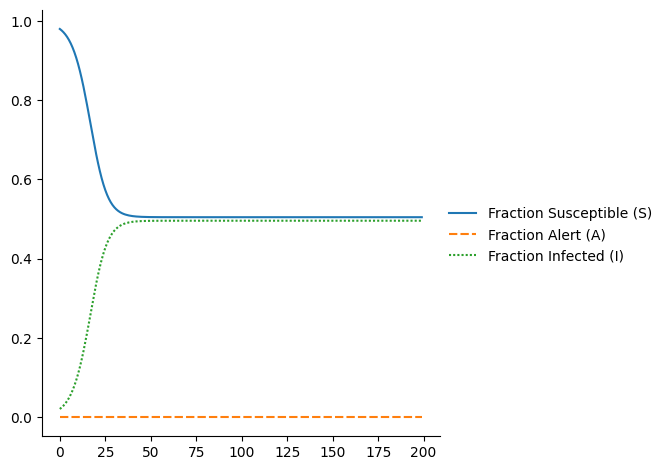

<Figure size 1000x500 with 0 Axes>

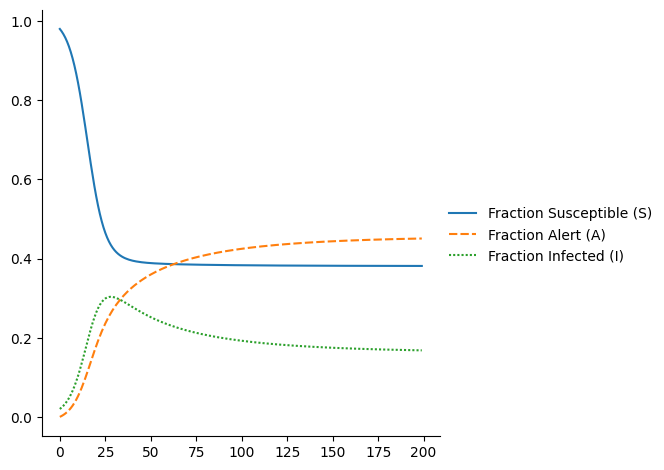

<Figure size 1000x500 with 0 Axes>

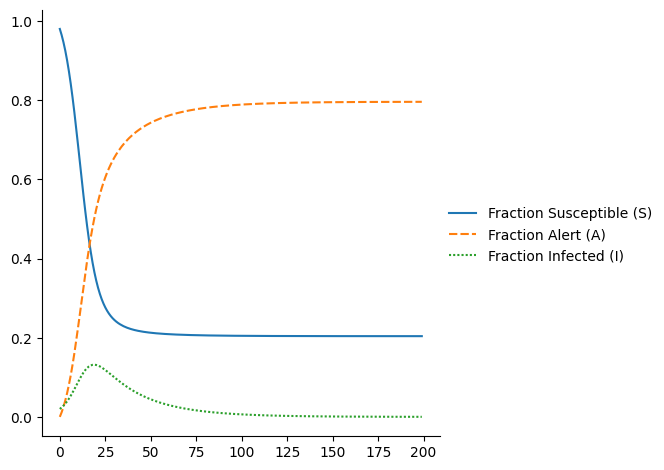

In [10]:
# Convert each prediction tensor into time series format (e.g., averaging node states at each timestep)
# preds_er contains multiple runs with different kappa values
er_series = [preds_to_time_series(pred) for pred in preds_er]

# Labels for the compartments to use in the plot legend
labels = ['Fraction Susceptible (S)', 'Fraction Alert (A)', 'Fraction Infected (I)']

# Loop over each time series to plot the fraction of nodes in each state over time
for series in er_series:
    epilearn.visualize.plot_series(
        series,      # [steps, 3] tensor/array with fraction of S, A, I per timestep
        labels,      # Labels for S, A, I
        fig_size=(10, 5)  # Figure size for clear visualization
    )

##### The paper's results in contrast

The results from the paper track only the infected fraction. When you compare with the above three figures, you can see that our model's results closely resemble that of the paper.

What to look for: Compare the plots from the paper with the infected fraction (green dashed) in our model's output.

Monte Carlo simulation for Erdős–Rényi graph with N = 500, p = 0 .07, λ1≈p×N = 35.

The initial infected population is 2% of the whole population. The simulation parameters are δ = 0.2 Day−1, β = 2 δ/λ1, βa = 1/2×δ/λ1 and (a) κ = 0, (b) κ = 0.6 × κc, (c) κ = 3 × κc.



![Image 2](image2.png)

**Note:** The below graph plots total 9 plots. Each group of 3 represent 1 of 3 predictions on the same Erdős–Rényi graph, each at different time steps. That means that plots 1-3 represent one prediction (with its own states / dynamics), while 4-6 and 7-9 represent another prediction (with its own states / dynamics).

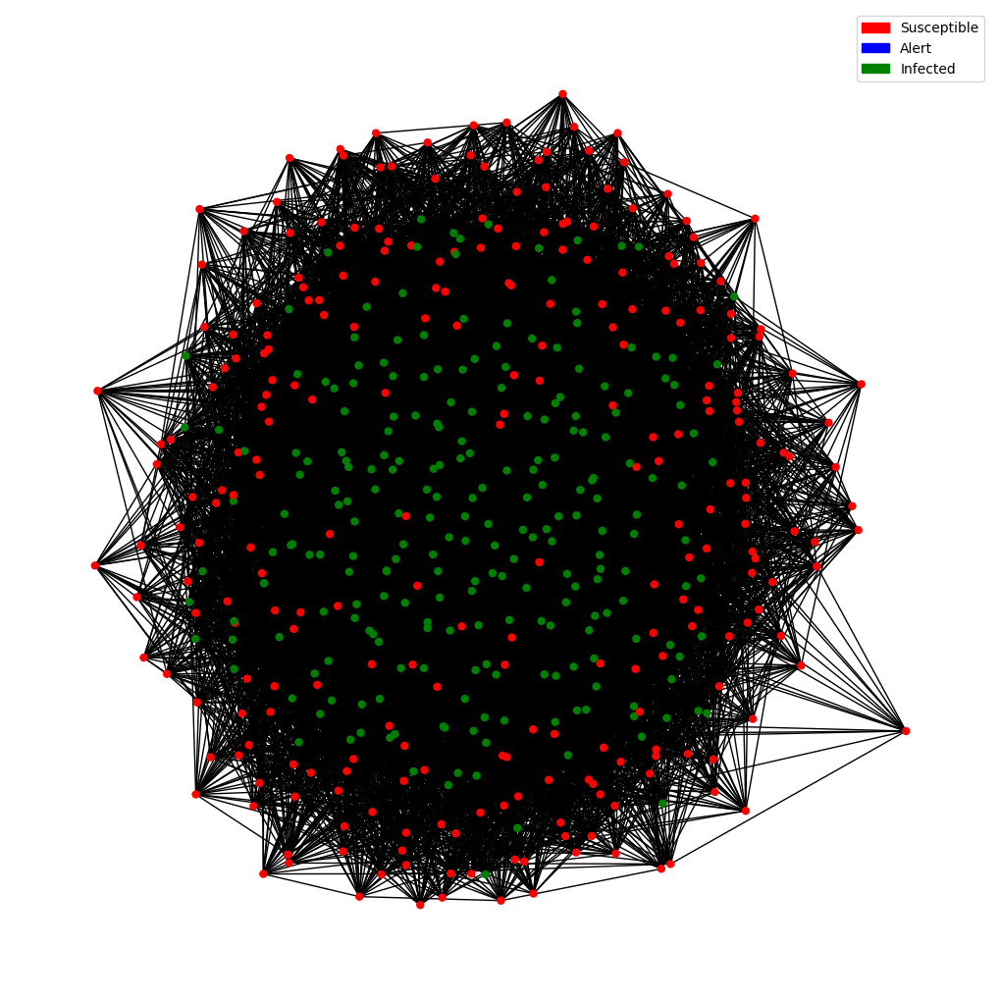

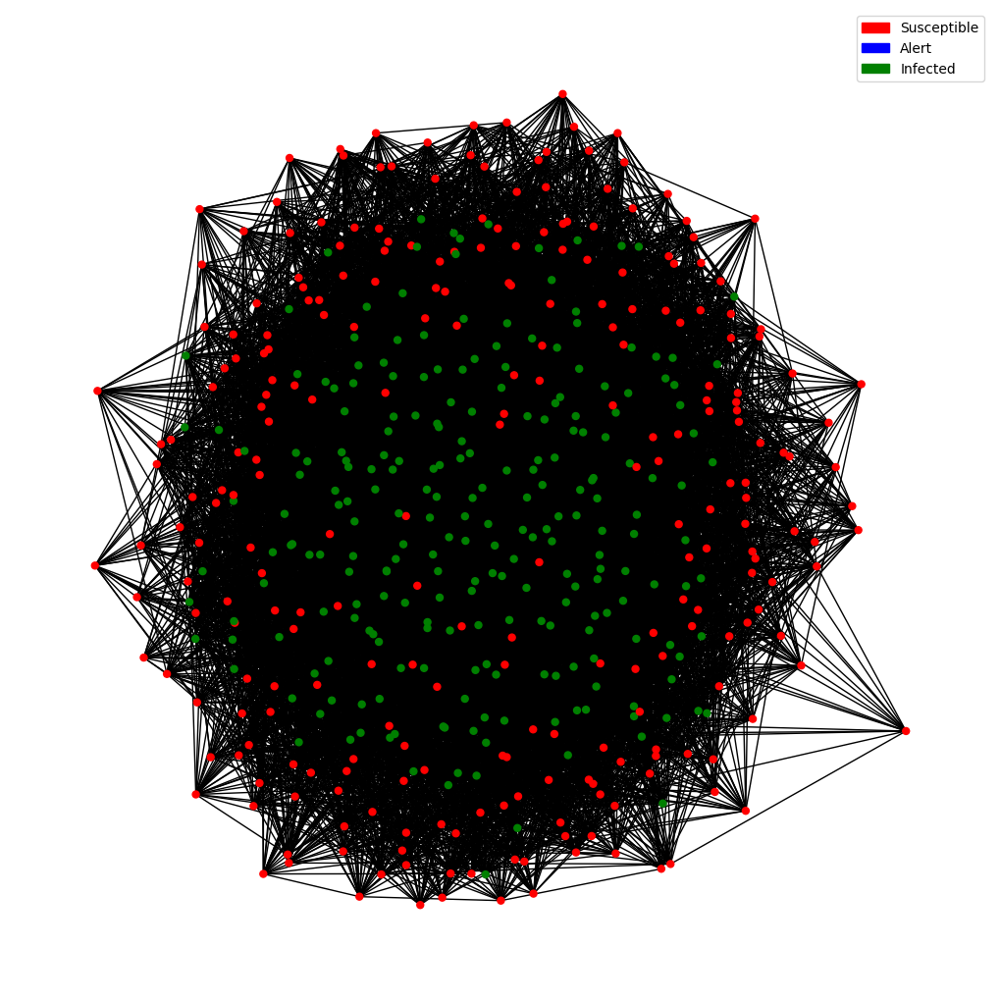

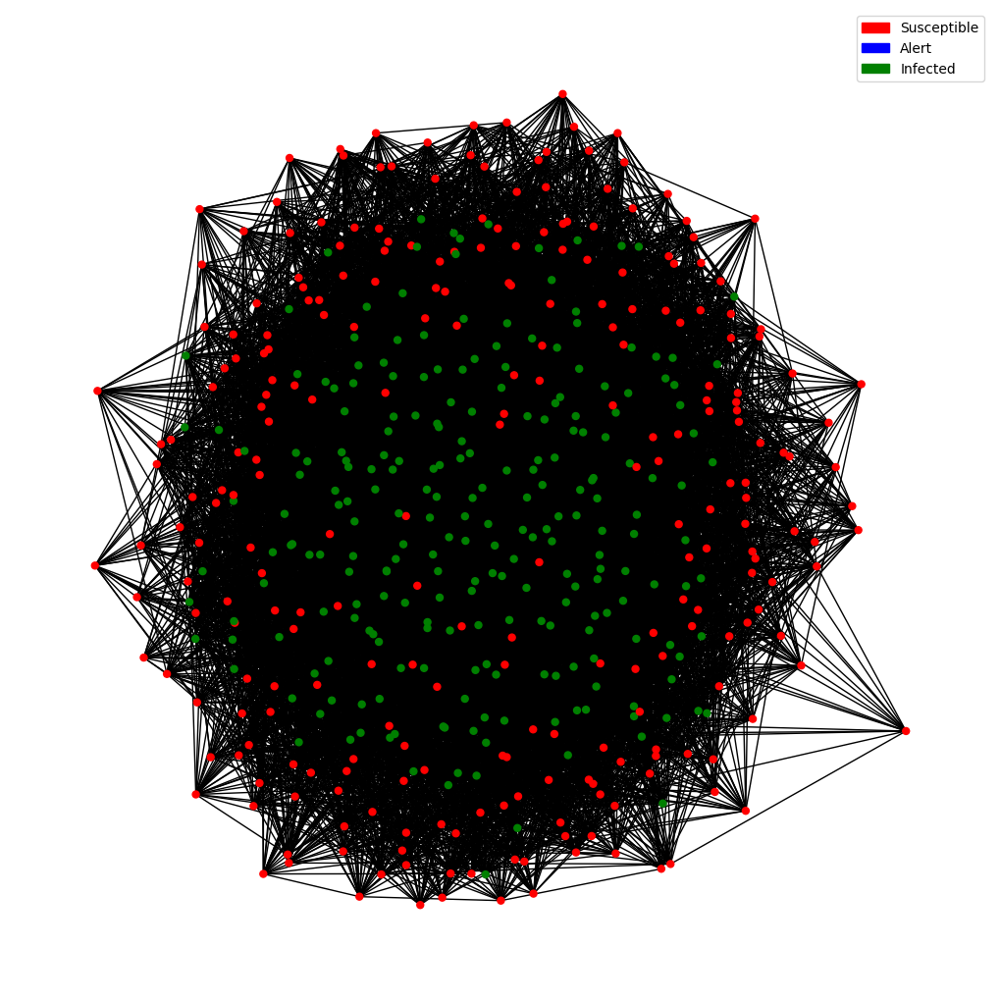

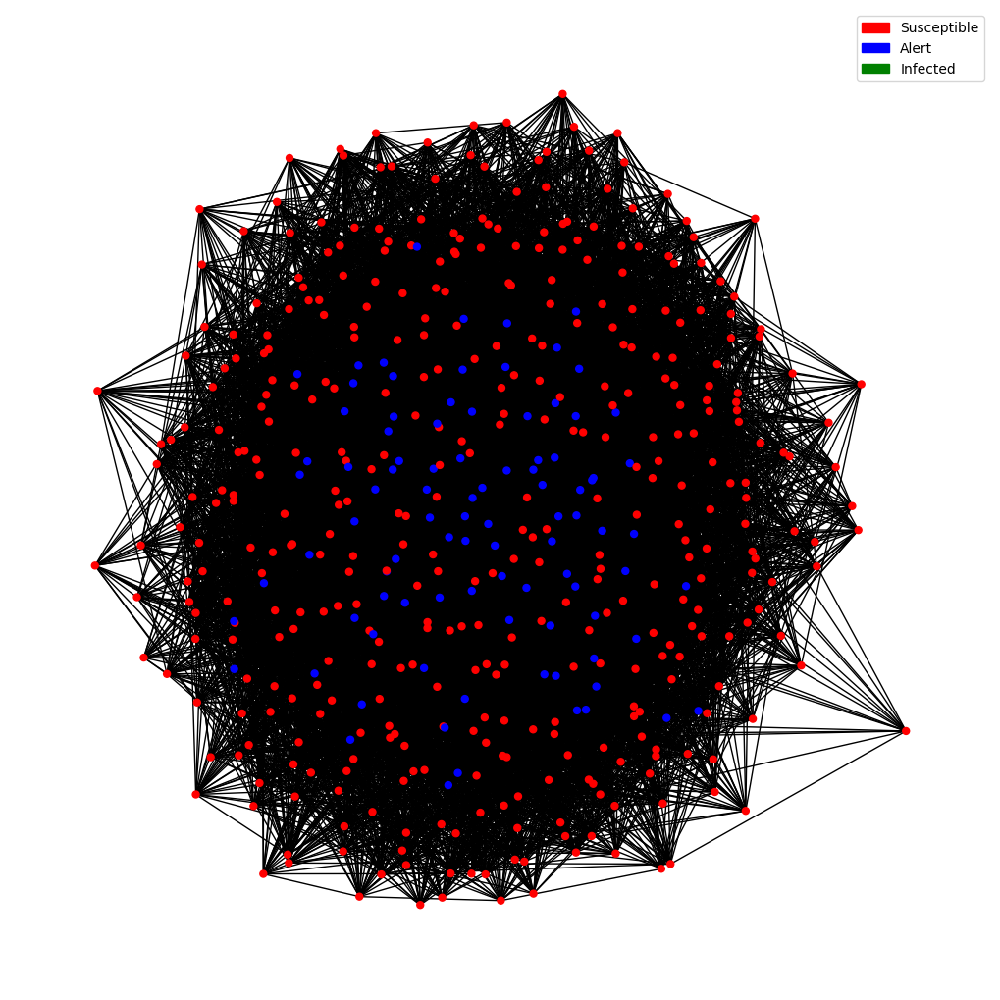

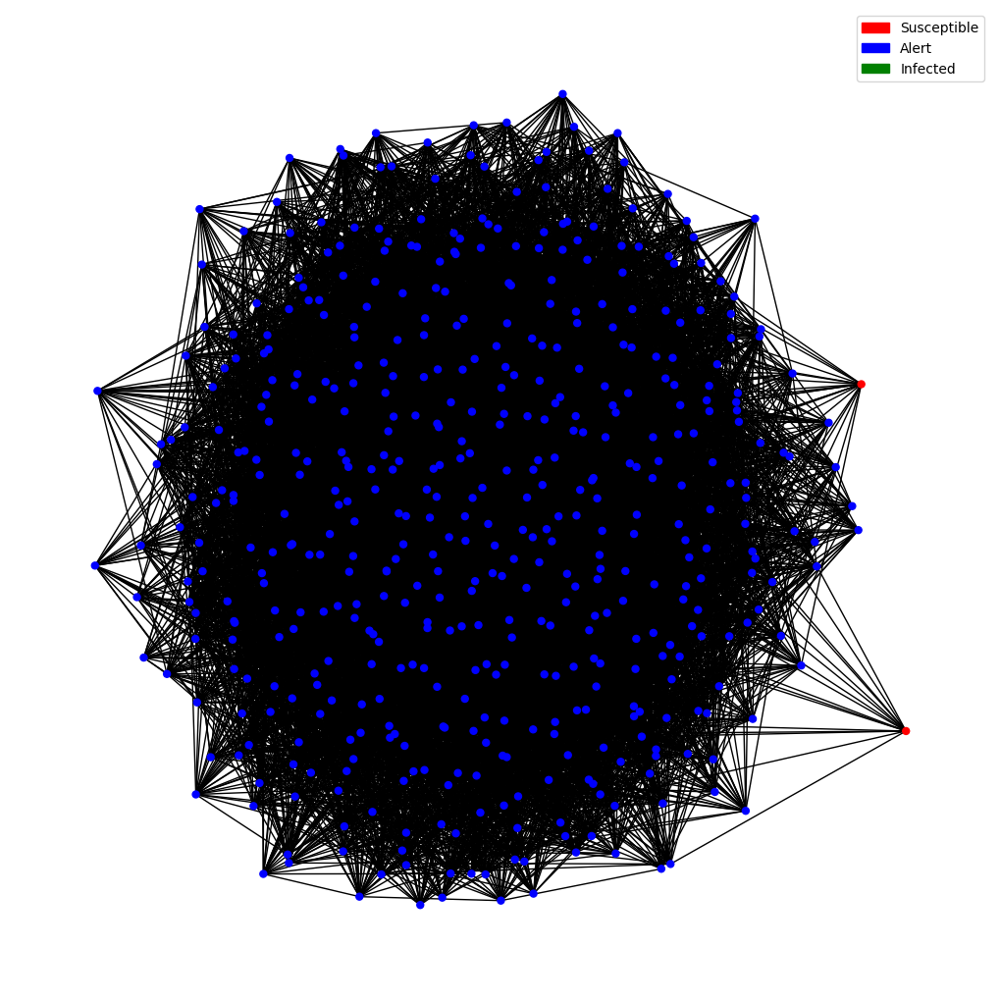

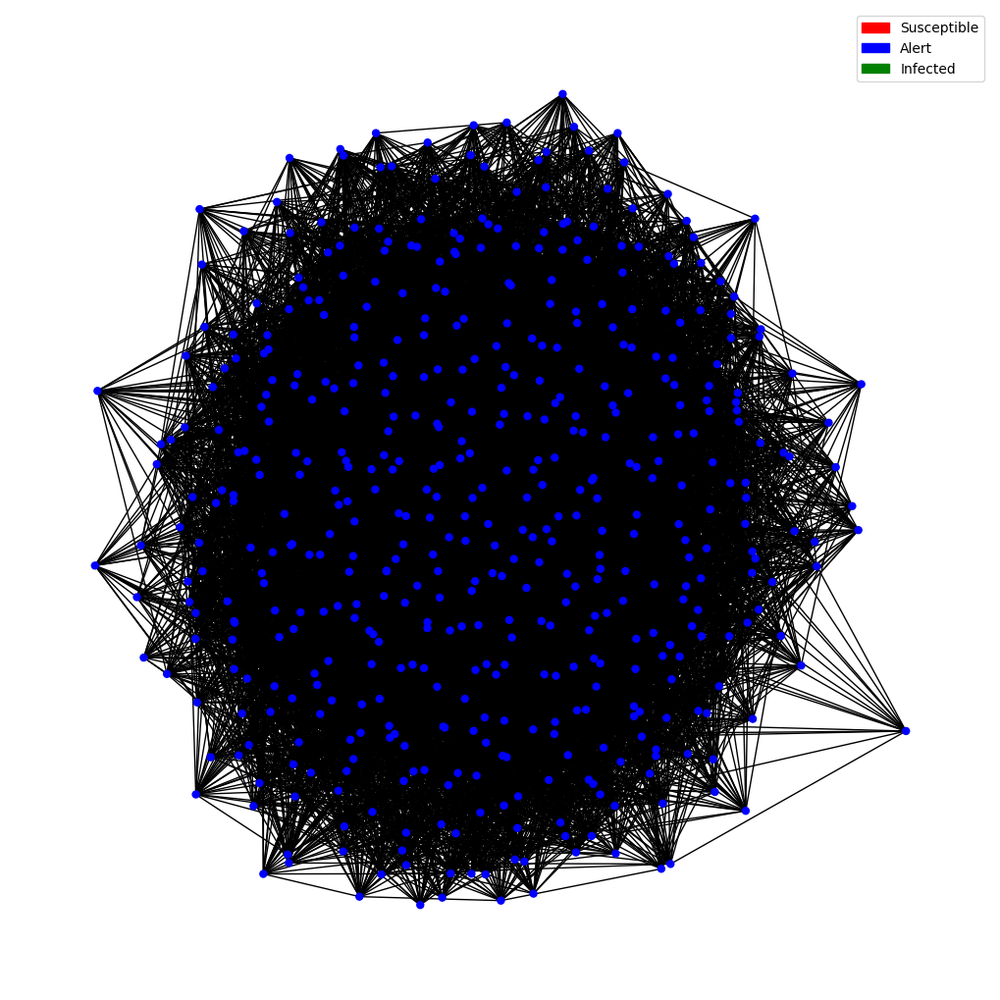

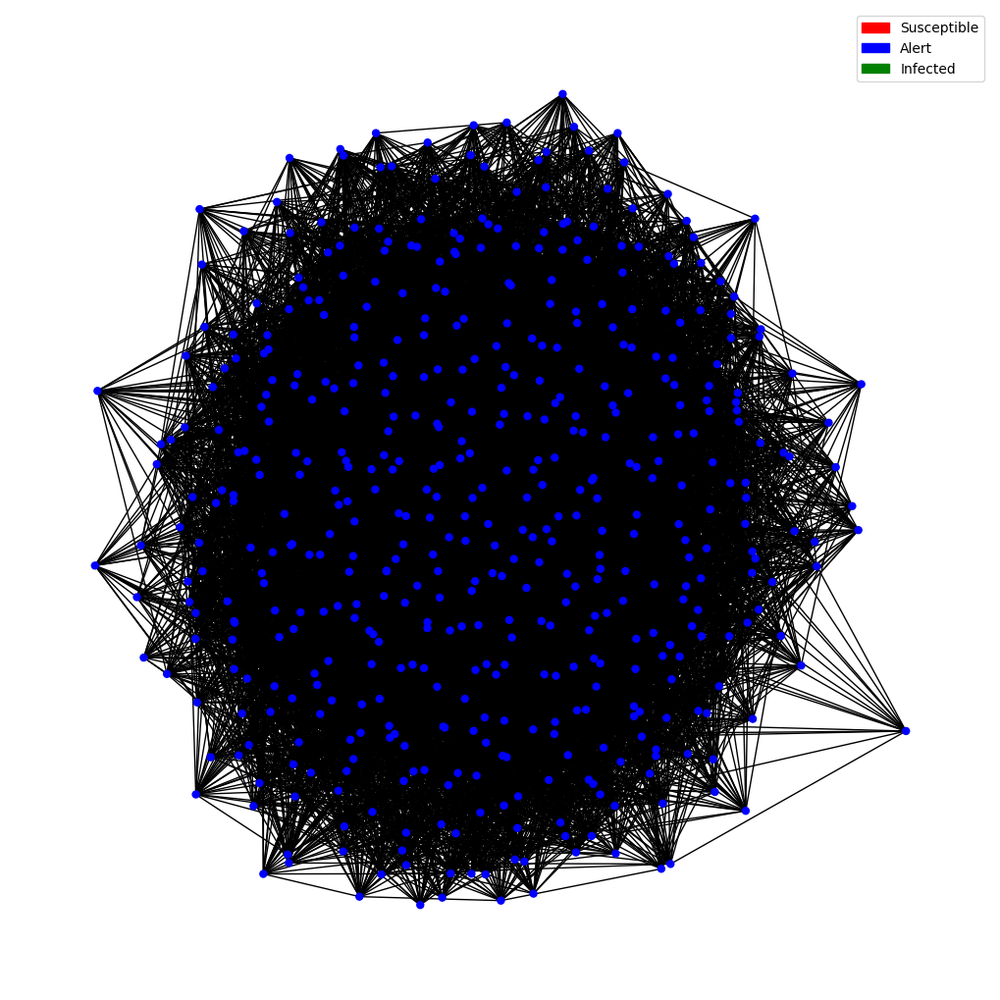

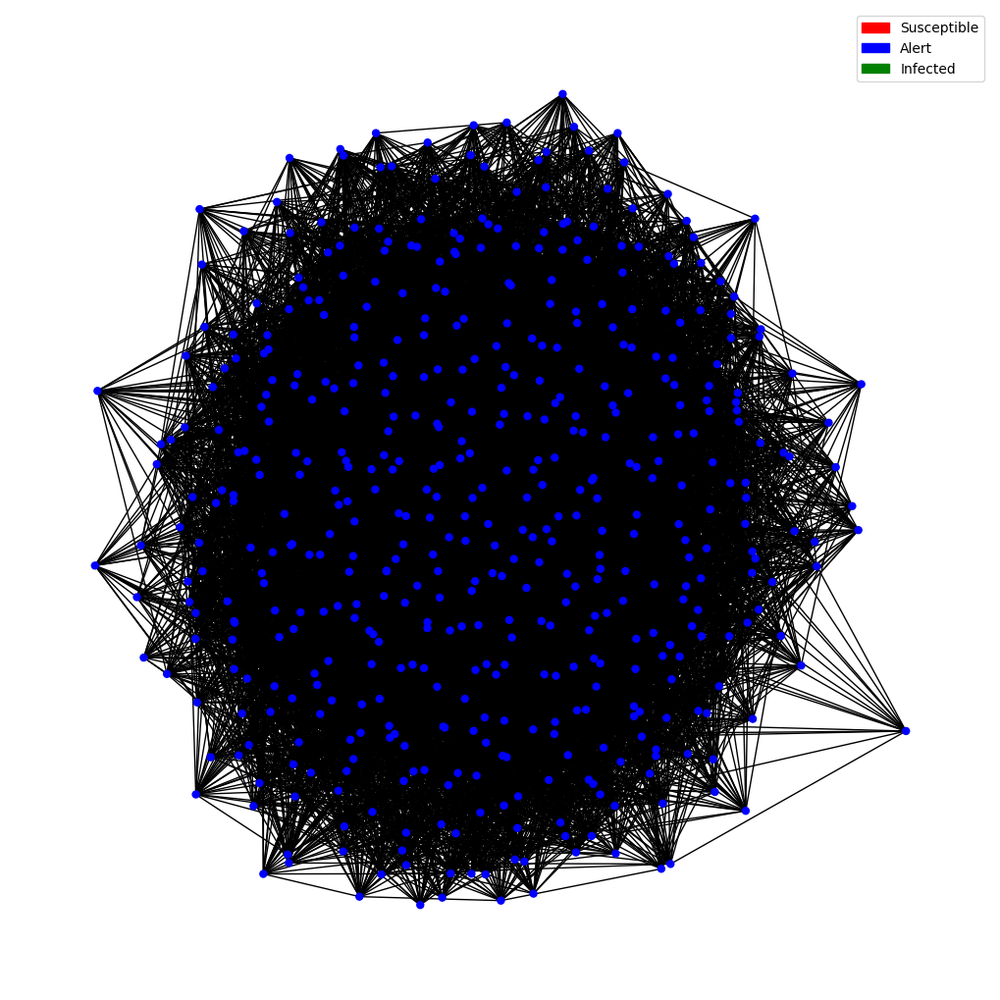

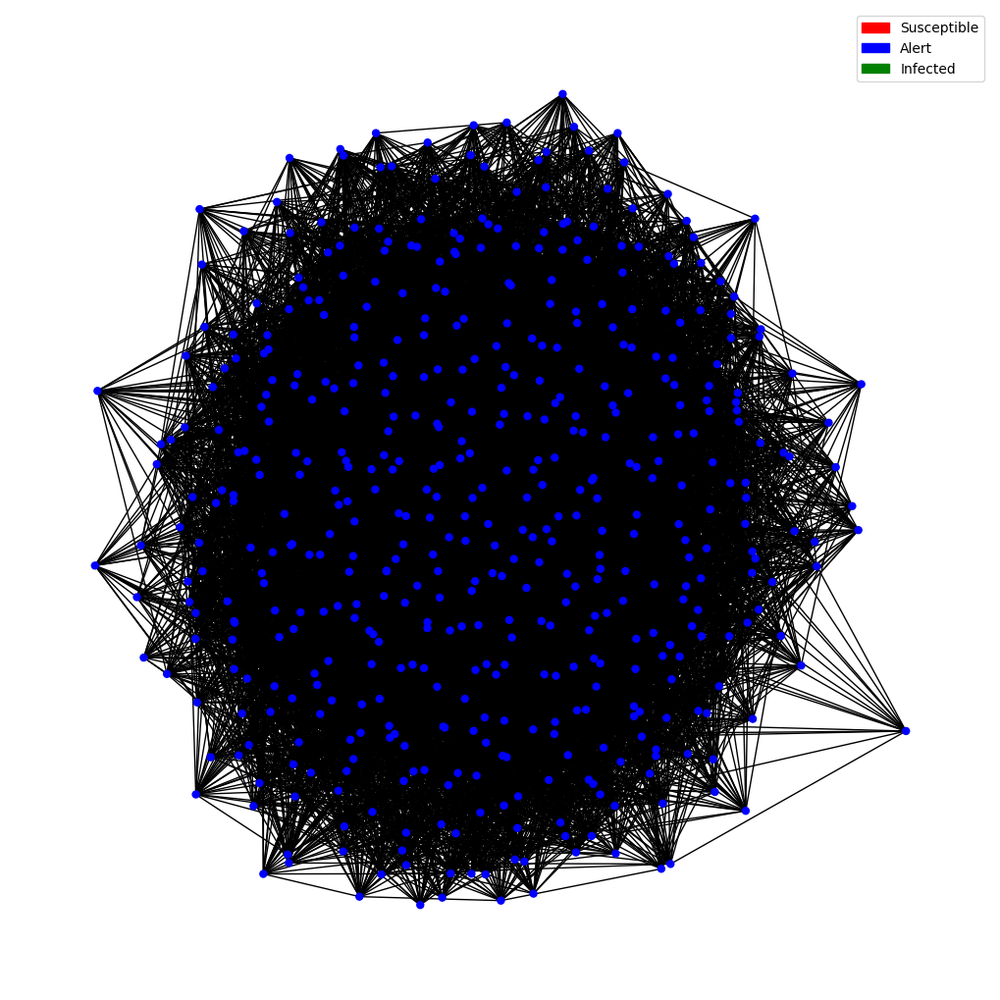

In [11]:
# Extract edge indices from the adjacency matrix for plotting the graph structure
# Format: [2, num_edges], suitable for many graph plotting functions
graph_er = adj_er.to_sparse().indices().detach().numpy()

# Loop over each prediction result (corresponding to different kappa values)
for pred in preds_er:

    # Visualize snapshots at time steps 50, 100, and 150
    for t in [50, 100, 150]:

        # Extract the node state probabilities/fractions at time t: shape [num_nodes, 3]
        states = pred[t]

        # For each node, pick the state with the highest probability
        # This converts from continuous fractions to discrete classes: 0=S, 1=A, 2=I
        node_classes = torch.argmax(states, dim=1).tolist()

        # Plot the graph with nodes colored by their discrete class labels
        epilearn.visualize.plot_graph(
            states=node_classes,                  # Node state labels for coloring
            graph=graph_er,                      # Edge indices for graph layout
            classes=['Susceptible', 'Alert', 'Infected'],  # Legend labels
        )

#### Lattice Network (Figure 6)

Here we visualize the results for the lattice network in Figure 6.

**Note:** Each of the 3 plots below represent 3 different predictions on the lattice graph with its own states / dynamics

<Figure size 1000x500 with 0 Axes>

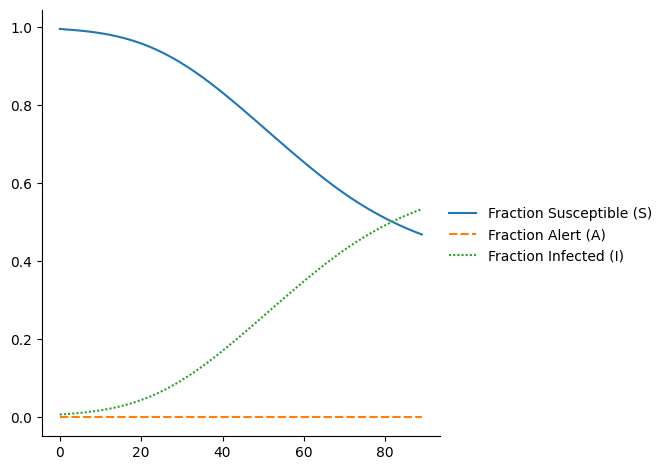

<Figure size 1000x500 with 0 Axes>

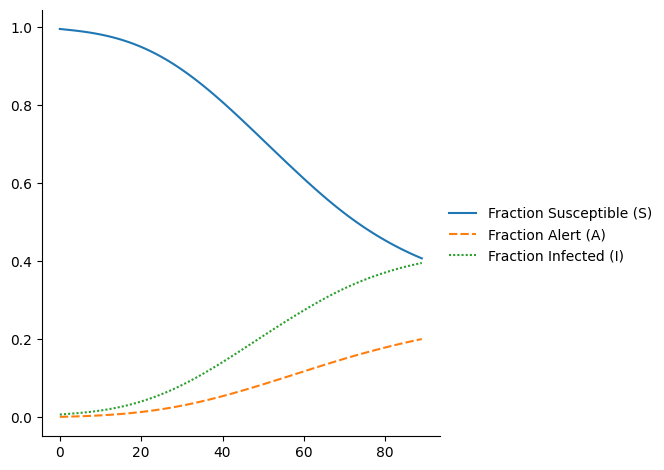

<Figure size 1000x500 with 0 Axes>

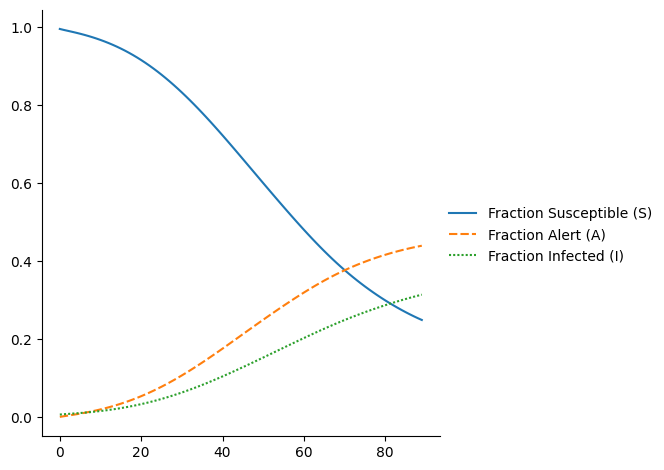

In [12]:
# Convert each prediction tensor (steps x nodes x 3) into time series data of mean fractions per state
lattice_series = [preds_to_time_series(pred) for pred in preds_lattice]

# For each time series (corresponding to a different κ and βₐ configuration)
for series in lattice_series:
    epilearn.visualize.plot_series(
        series,    # [steps x 3] tensor: time evolution of S, A, I fractions averaged over all nodes
        labels,    # Labels for the three states: ['Fraction Susceptible (S)', 'Fraction Alert (A)', 'Fraction Infected (I)']
        fig_size=(10, 5)  # Plot size for clarity
    )

**Note:** The below graph plots total 9 plots. Each group of 3 represent 1 of 3 predictions on the same lattice, each at different time steps. That means that plots 1-3 represent one prediction (with its own states / dynamics), while 4-6 and 7-9 represent another prediction (with its own states / dynamics).

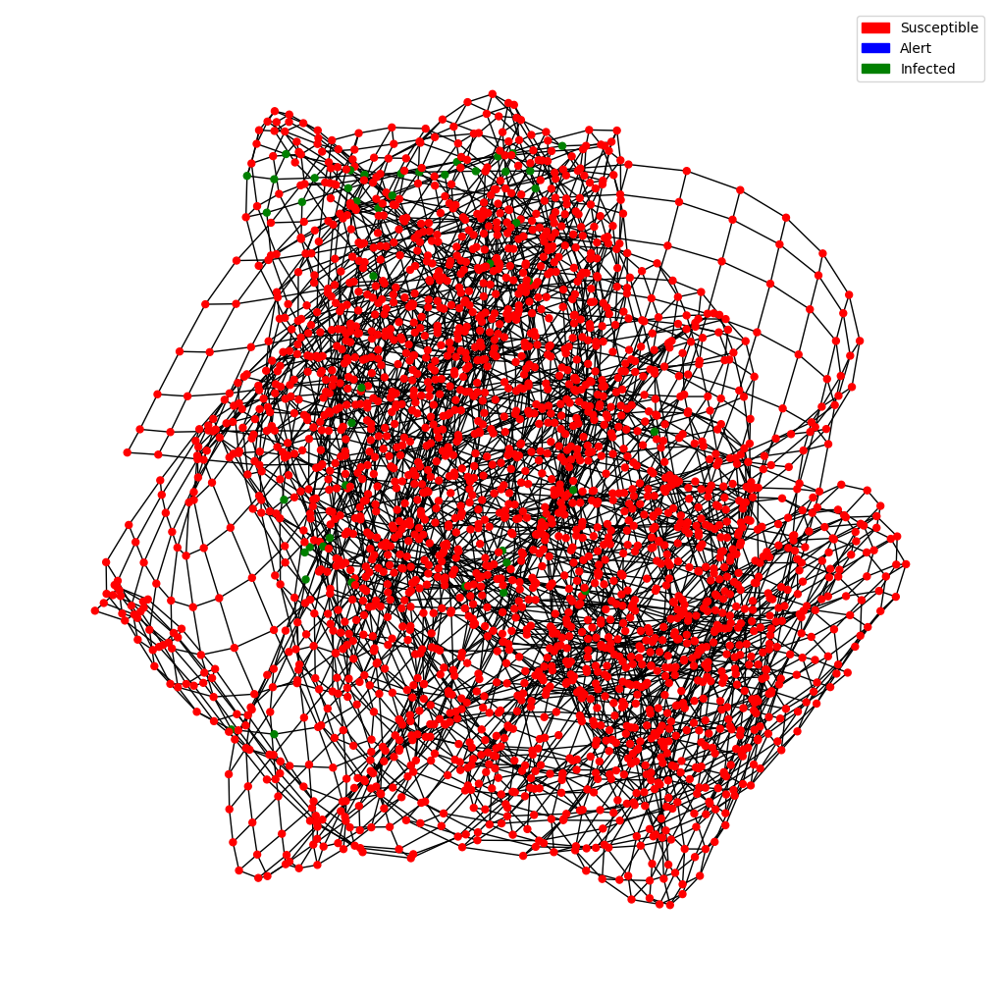

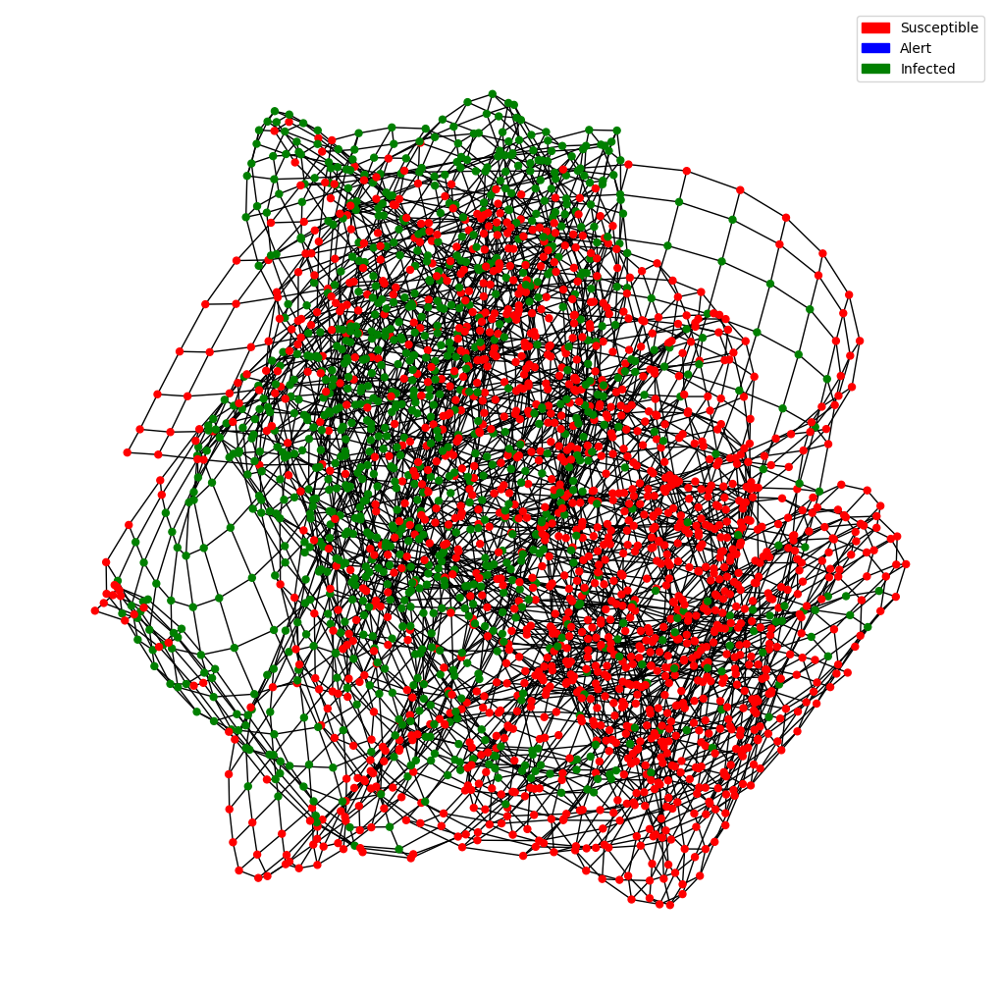

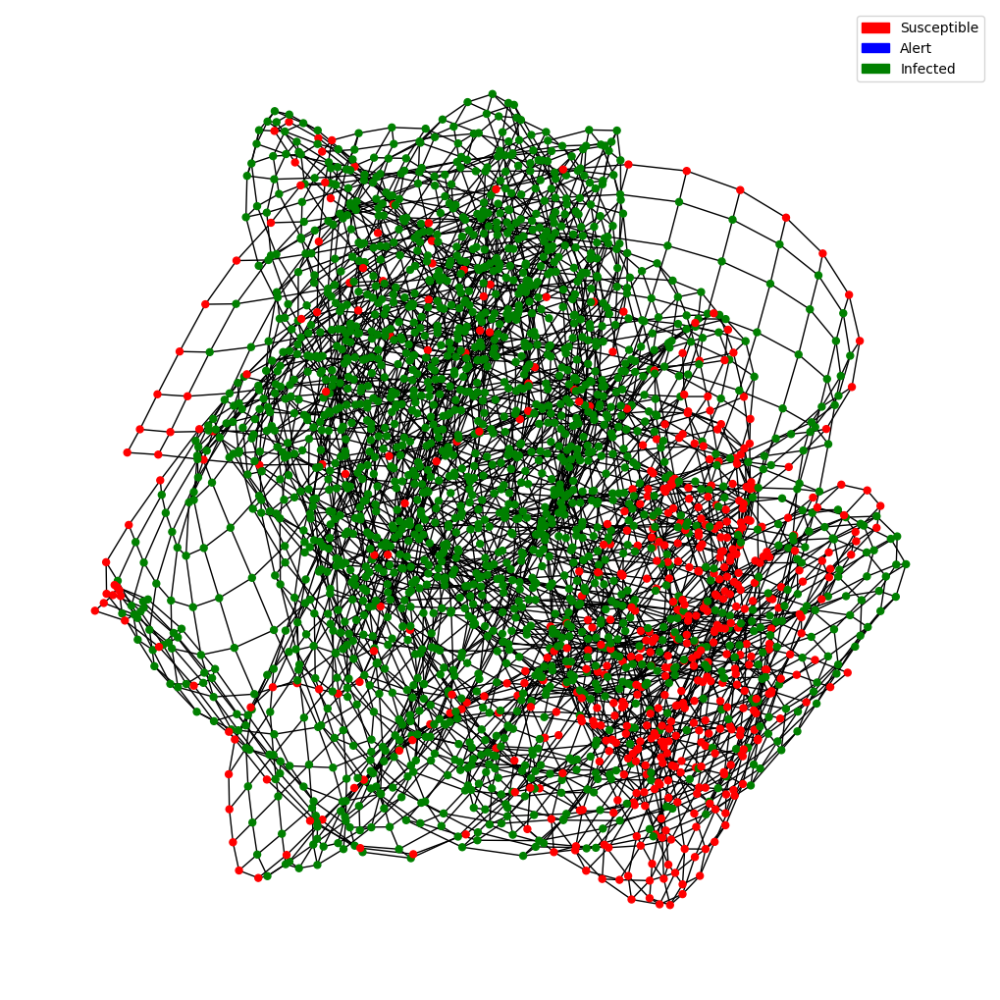

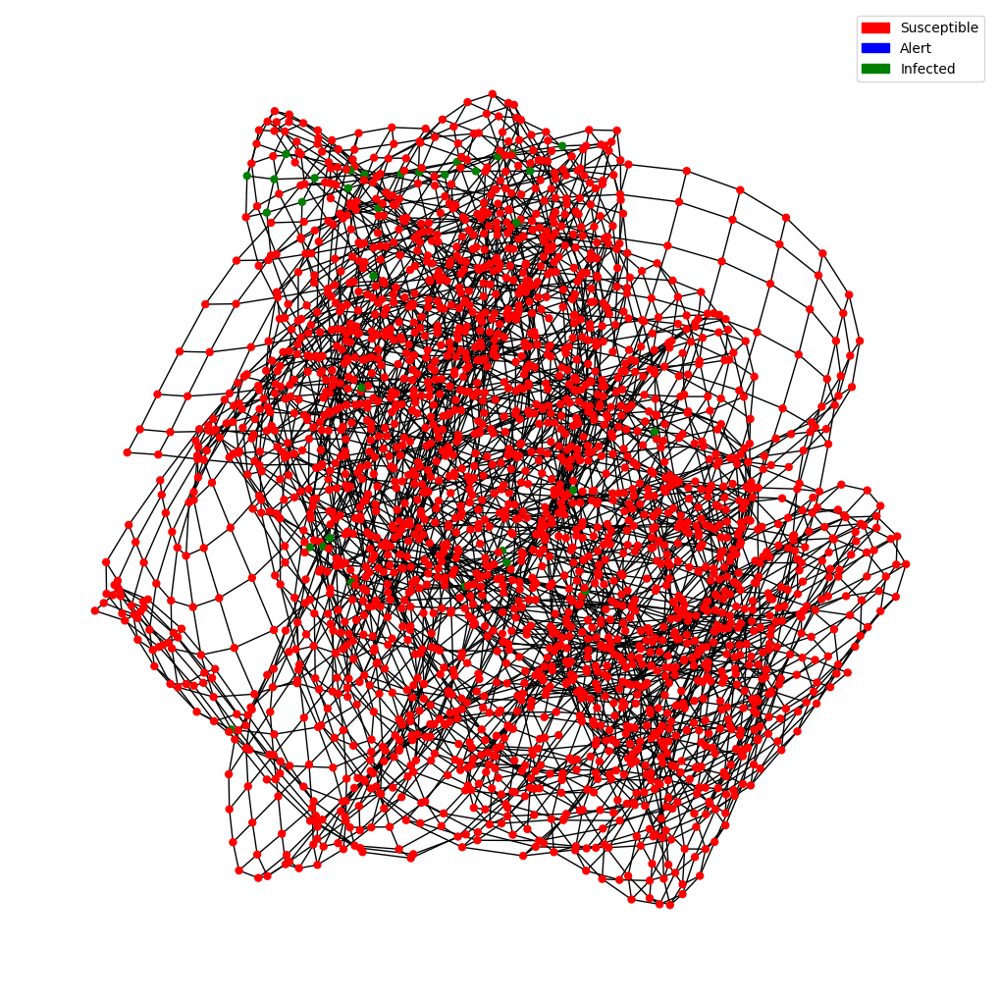

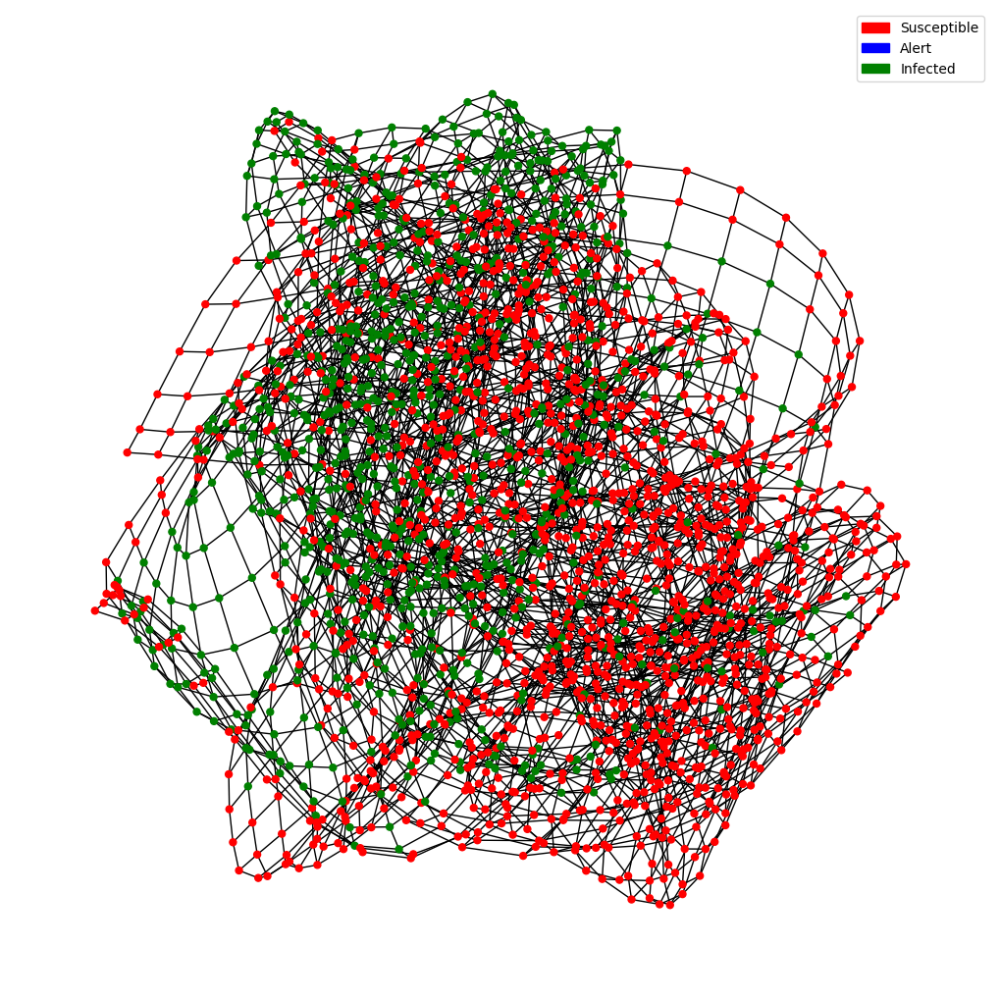

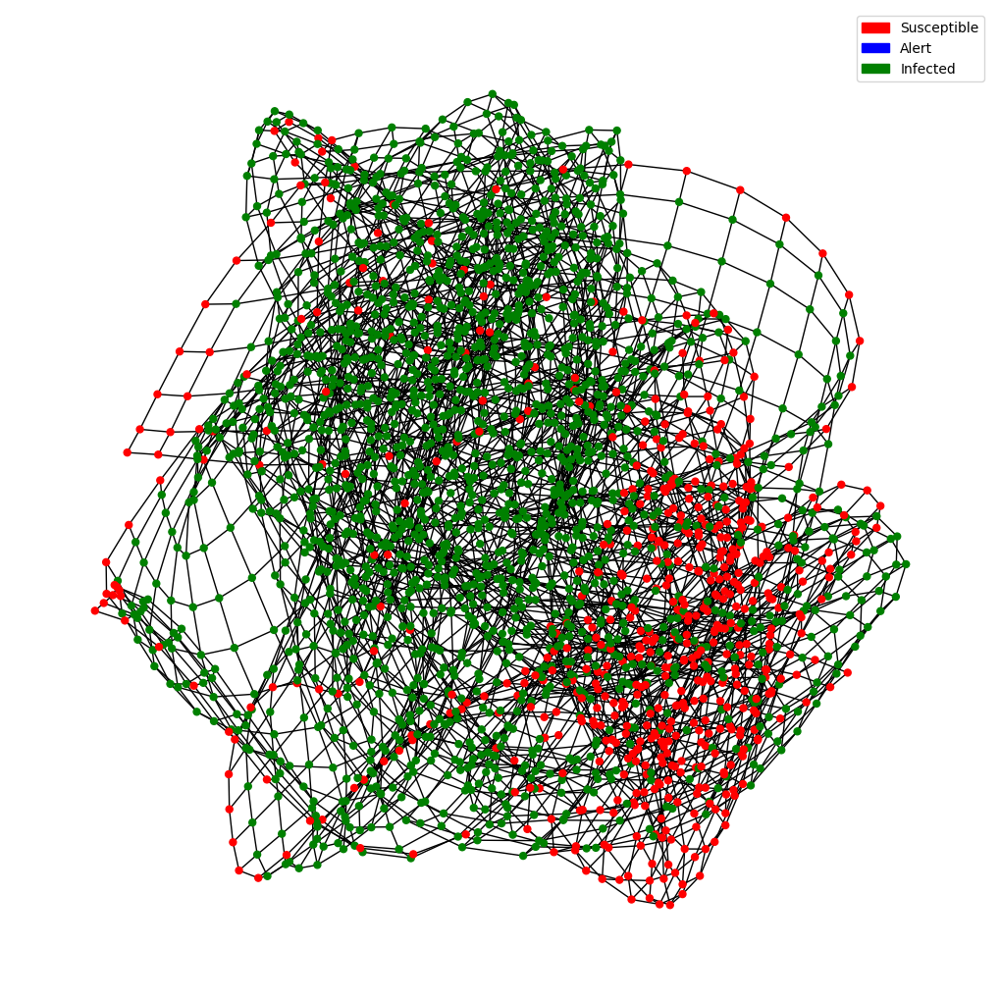

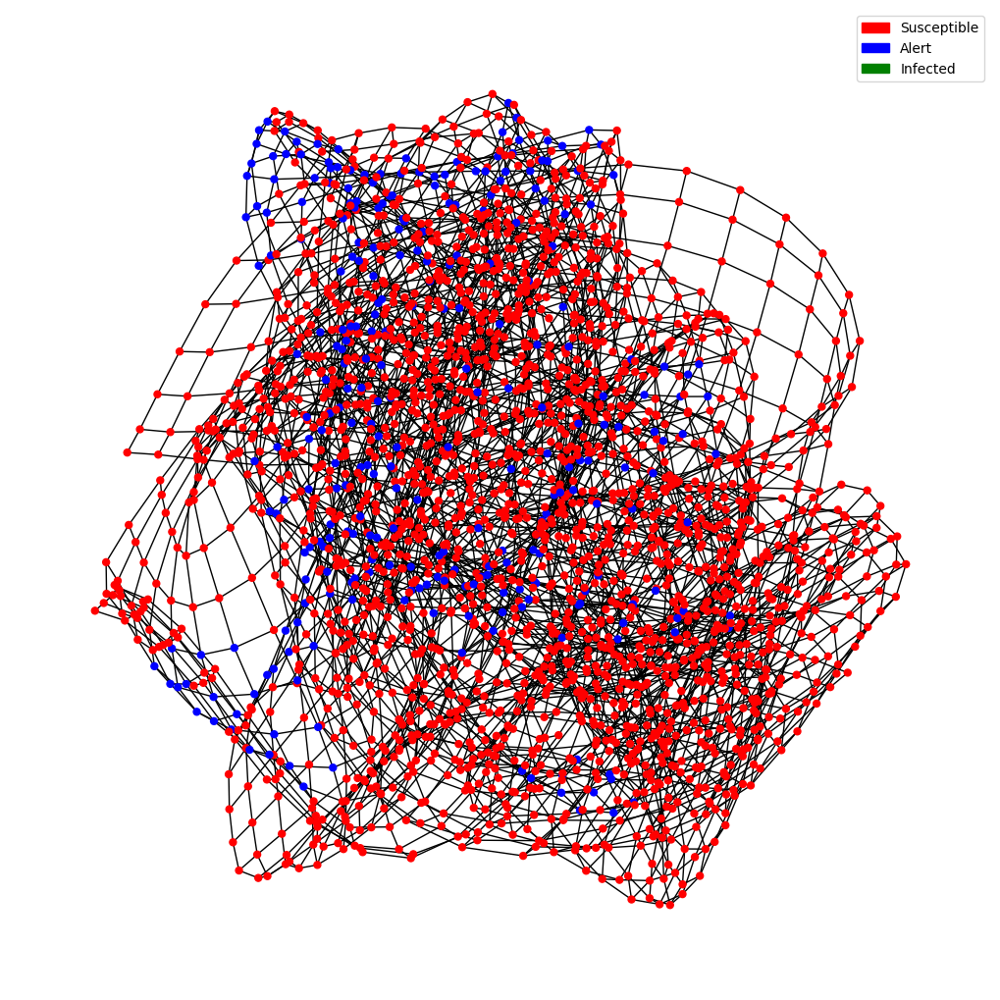

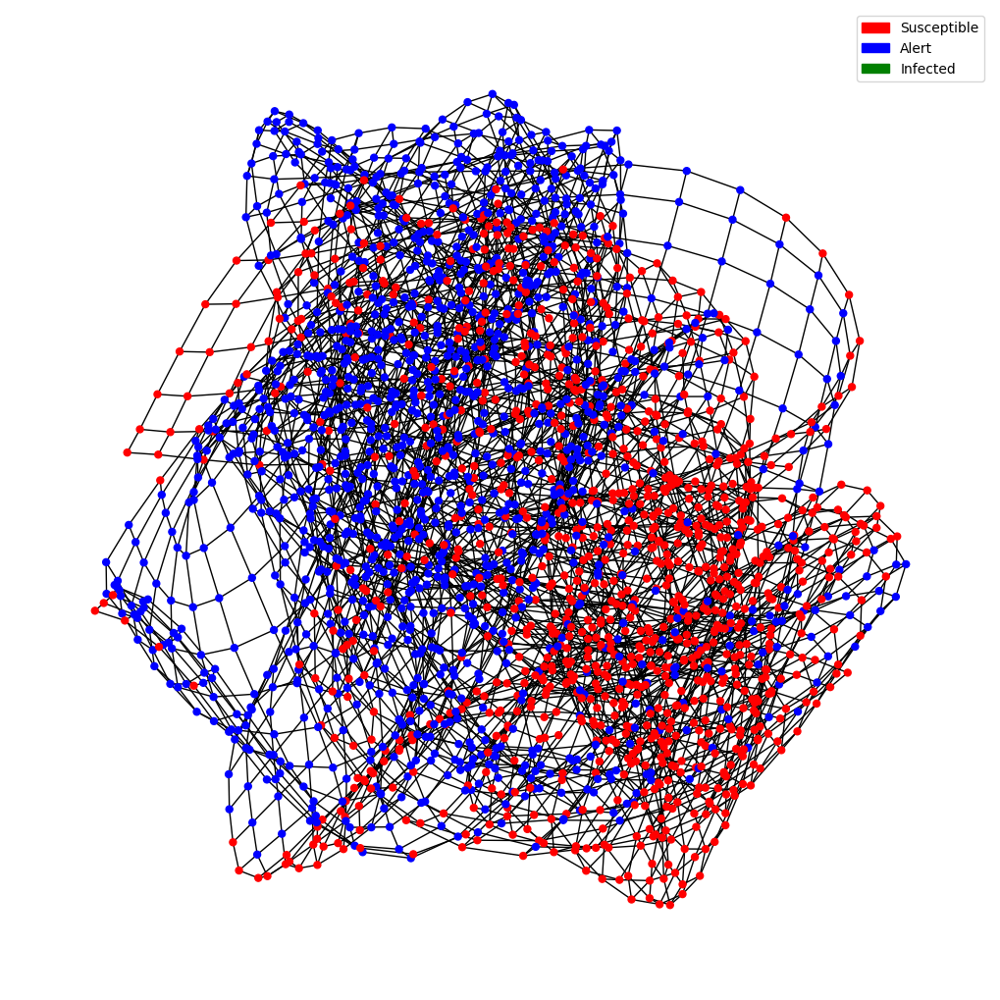

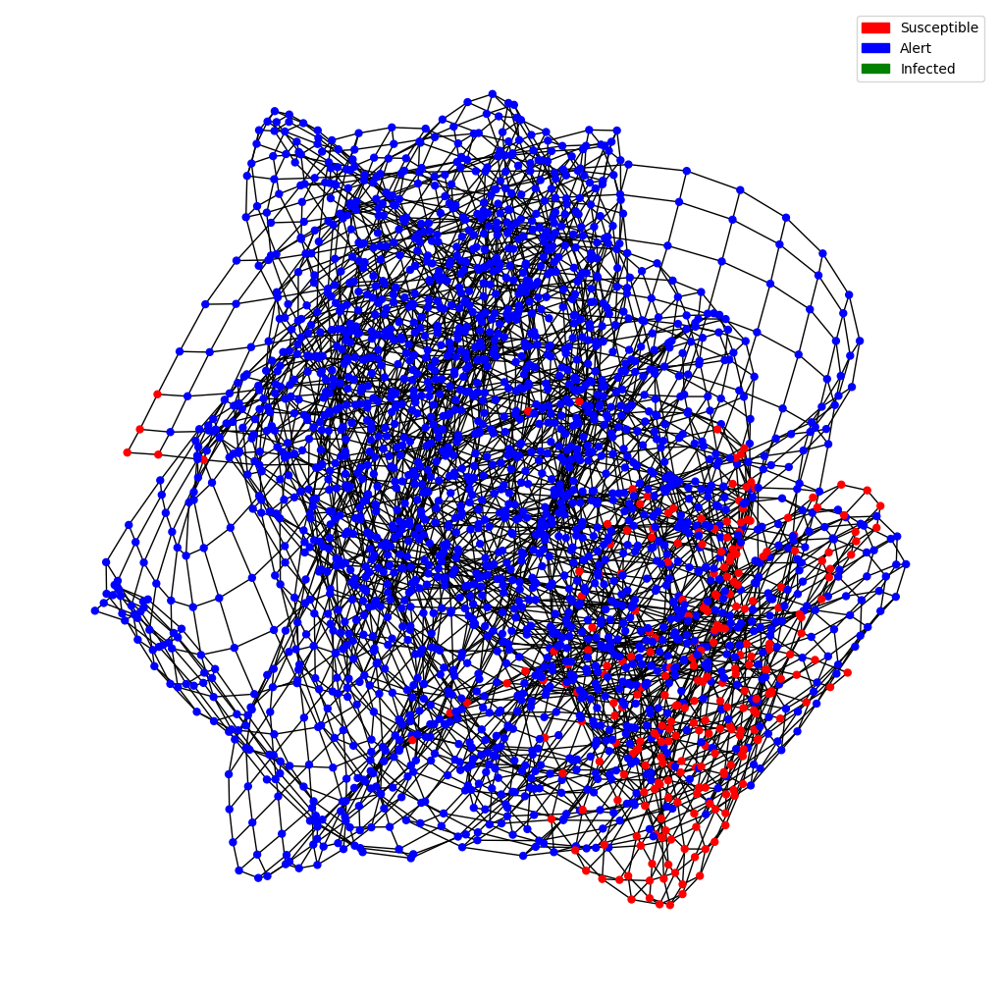

In [13]:
# Get sparse edge indices for the lattice graph in the format [2, num_edges]
graph_lattice = adj_lattice.to_sparse().indices().detach().numpy()

# Loop over each prediction tensor from the different SAIS model runs on the lattice
for pred in preds_lattice:

    # Visualize snapshots at 3 specific time points (30, 60, and 89)
    for t in [30, 60, 90-1]:  # Note: 90-1 = 89 since indexing starts at 0

        # Extract the state probabilities [num_nodes, 3] at time t
        states = pred[t]

        # Convert state probabilities to discrete class labels (0=S, 1=A, 2=I)
        node_classes = torch.argmax(states, dim=1).tolist()

        # Plot the graph with nodes colored by their class label
        epilearn.visualize.plot_graph(
            states=node_classes,
            graph=graph_lattice,
            classes=['Susceptible', 'Alert', 'Infected'],  # Legend labels
        )

One noteworthy quirk about the spatial plot (& argmax) is that it shows only the dominant state per node, so if a state never dominates any node, it won’t show up as a color. That is why only two of the three compartments are shown in the plots.



(a) SIS epidemic spreading on the lattice contact network with R0 = 2.5, δ = 0.1 Day−1. Red dots represent infected nodes, (b) SAIS epidemic spreading with R0 = 2.5, δ = 0.1 Day−1, βa = β/4, and κ = κc/2. Red dots represent infected nodes while the green dots denote the alert nodes. Alertness is reducing the epidemic size for alertness rate κ < κc, (c) SAIS epidemic spreading with R0 = 2.5, δ = 0.1 Day−1, βa = β/2 and κ = 3κc. Red dots represent infected nodes while the green dots denote the alert nodes. Alertness is suppressing the infection for alertness rate κ > κc.

![Image 3](image3.png)

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=7d77eb0b-c0bd-4aa9-bfd4-9695dcd4d475' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>